<a href="https://colab.research.google.com/github/mudassar2224/RAG_Phase_2_Document_Ingestion_Lab-LLM-Journey-/blob/main/RAG_Phase_2_Document_Ingestion_Lab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# RAG Phase 2 — Document Ingestion Lab

Goal:
Convert different real-world document formats into a
standardized Document(text, metadata) representation.

Sources:
- TXT
- Markdown
- PDF
- DOCX
- HTML
- CSV
- JSON

Pipeline:

Load → Extract → Clean → Structure → Metadata → Validate

In [ ]:
!pip -q install pypdf python-docx beautifulsoup4 lxml pandas

In [ ]:
import os
import re
import json
import hashlib
import pandas as pd

from pathlib import  Path
from pypdf import PdfReader
from bs4 import BeautifulSoup
from docx import Document as DocxDocument

In [ ]:
from dataclasses import dataclass, field
from typing import Dict, Any


@dataclass
class Document:
    text: str
    metadata: Dict[str, Any] = field(default_factory=dict)


# **TXT**

In [ ]:
txt_content = """
UMT Admissions 2026

Eligibility

Applicants must have at least 50% marks.

BS Artificial Intelligence

The BS Artificial Intelligence program is a four-year degree.
"""

with open("admissions.txt", "w", encoding="utf-8") as f:
    f.write(txt_content)

# **Load TXT**

In [ ]:
def load_txt(path):
    with open(path, "r", encoding="utf-8") as f:
        text = f.read()

    return Document(
        text=text,
        metadata={
            "source": path,
            "type": "txt"
        }
    )

In [ ]:
doc = load_txt("admissions.txt")

print(doc.text)
print(doc.metadata)


UMT Admissions 2026

Eligibility

Applicants must have at least 50% marks.

BS Artificial Intelligence

The BS Artificial Intelligence program is a four-year degree.

{'source': 'admissions.txt', 'type': 'txt'}


# **Markdown**

In [ ]:
markdown_content = """# UMT Admissions 2026

## Eligibility

Applicants must have at least 50% marks.

## BS Artificial Intelligence

The BS Artificial Intelligence program is a four-year degree.

## Fee Structure

The semester fee is 150,000 PKR.
"""

with open("admissions.md", "w", encoding="utf-8") as f:
    f.write(markdown_content)

In [ ]:
def load_markdown(path):
    with open(path, "r", encoding="utf-8") as f:
        text = f.read()

    return Document(
        text=text,
        metadata={
            "source": path,
            "type": "markdown"
        }
    )

In [ ]:
doc = load_markdown("admissions.md")

print(doc.text)

# UMT Admissions 2026

## Eligibility

Applicants must have at least 50% marks.

## BS Artificial Intelligence

The BS Artificial Intelligence program is a four-year degree.

## Fee Structure

The semester fee is 150,000 PKR.



# **Create a PDF**

*For learning, let's generate a small PDF containing multiple pages.*

In [ ]:
!pip -q install reportlab

In [ ]:
from reportlab.pdfgen import canvas

pdf_path = "admissions.pdf"

c = canvas.Canvas(pdf_path)

c.drawString(100, 750, "UMT Admissions 2026")
c.drawString(100, 700, "Eligibility")
c.drawString(100, 650, "Applicants must have at least 50% marks.")
c.drawString(100, 600, "BS Artificial Intelligence")
c.drawString(100, 550, "The program duration is four years.")

c.showPage()

c.drawString(100, 750, "Fee Structure")
c.drawString(100, 700, "The semester fee is 150,000 PKR.")

c.save()

In [ ]:
def load_pdf(path):

    reader = PdfReader(path)

    documents = []

    for page_number, page in enumerate(reader.pages, start=1):

        text = page.extract_text() or ""

        documents.append(
            Document(
                text=text,
                metadata={
                    "source": path,
                    "type": "pdf",
                    "page": page_number
                }
            )
        )

    return documents

In [ ]:
pdf_docs = load_pdf("admissions.pdf")

for doc in pdf_docs:
    print("=" * 50)
    print("PAGE:", doc.metadata["page"])
    print(doc.text)

PAGE: 1
UMT Admissions 2026
Eligibility
Applicants must have at least 50% marks.
BS Artificial Intelligence
The program duration is four years.

PAGE: 2
Fee Structure
The semester fee is 150,000 PKR.



In [ ]:
!pip -q install pdf2image
!sudo apt-get install -y poppler-utils

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
poppler-utils is already the newest version (22.02.0-2ubuntu0.13).
0 upgraded, 0 newly installed, 0 to remove and 15 not upgraded.


In [ ]:
from pdf2image import convert_from_path
from IPython.display import Image, display

def display_pdf_as_images(pdf_path):
    # Convert PDF to a list of images
    images = convert_from_path(pdf_path)

    # Display each page image
    print(f"Displaying PDF: {pdf_path}")
    for i, image in enumerate(images):
        print(f"Page {i+1}:")
        display(image)

Displaying PDF: admissions.pdf
Page 1:


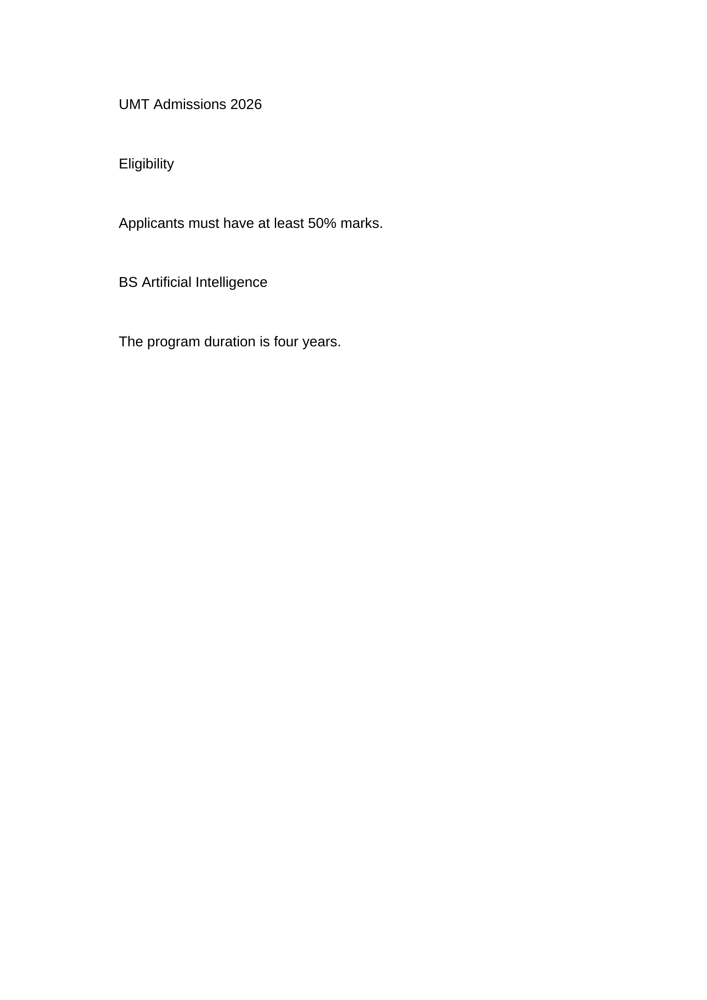

Page 2:


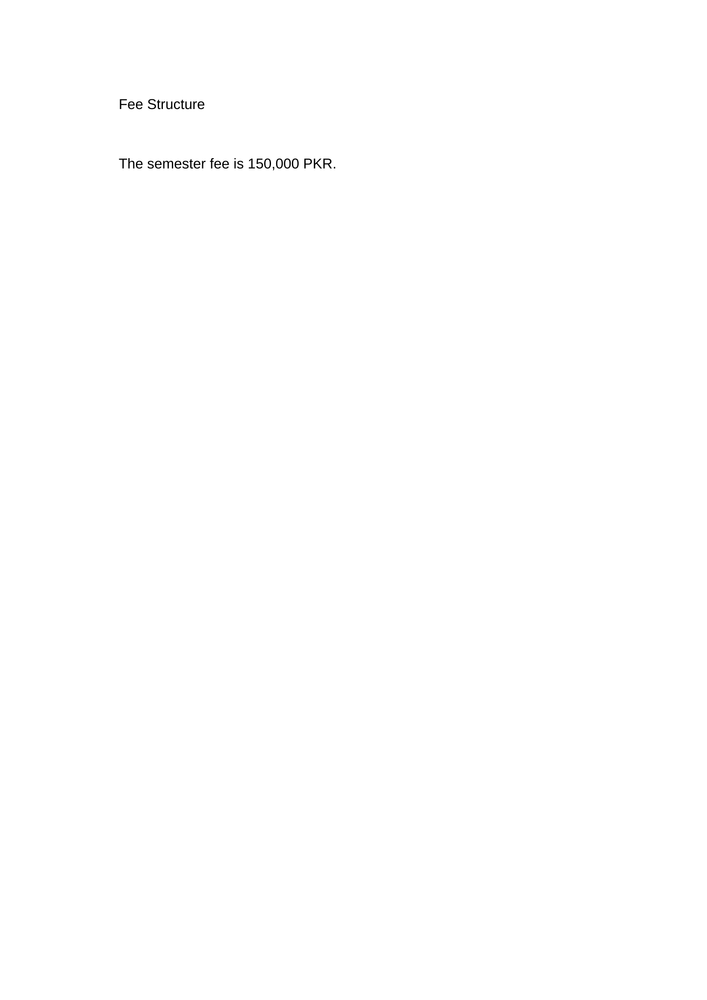

In [ ]:
display_pdf_as_images(pdf_path)

# **DOCX**

In [ ]:
from docx import Document as WordDocument

word_doc = WordDocument()

word_doc.add_heading("UMT Admissions 2026", level=1)

word_doc.add_heading("Eligibility", level=2)
word_doc.add_paragraph(
    "Applicants must have at least 50% marks."
)

word_doc.add_heading("BS Artificial Intelligence", level=2)
word_doc.add_paragraph(
    "The program duration is four years."
)

word_doc.save("admissions.docx")

In [ ]:
from docx import Document as DocxDocument
def load_docx(path:str)-> Document:
  docx=DocxDocument(path)
  paragraphs=[
      paragraph.text
      for paragraph in docx.paragraphs
      if paragraph.text.strip()


  ]
  text="\n".join(paragraphs)
  return Document(
      text=text,
      metadata={
          "source":path ,
          "type":"docx"
      }
  )





In [ ]:
doc = load_docx("admissions.docx")

print(doc.text)

UMT Admissions 2026
Eligibility
Applicants must have at least 50% marks.
BS Artificial Intelligence
The program duration is four years.


# **HTML**

In [ ]:
html_content = """
<html>
<head>
<title>UMT Admissions</title>
</head>

<body>

<h1>UMT Admissions 2026</h1>

<h2>Eligibility</h2>

<p>Applicants must have at least 50% marks.</p>

<h2>BS Artificial Intelligence</h2>

<p>The program duration is four years.</p>

<a href="https://example.com/admissions">
Admission Form
</a>

</body>
</html>
"""

with open("admissions.html", "w", encoding="utf-8") as f:
    f.write(html_content)

In [ ]:
def load_html(path):

    with open(path, "r", encoding="utf-8") as f:
        html = f.read()

    soup = BeautifulSoup(html, "html.parser")

    text = soup.get_text("\n")

    return Document(
        text=text,
        metadata={
            "source": path,
            "type": "html"
        }
    )

In [ ]:
doc = load_html("admissions.html")

print(doc.text)







UMT Admissions






UMT Admissions 2026


Eligibility


Applicants must have at least 50% marks.


BS Artificial Intelligence


The program duration is four years.



Admission Form









# **CSV**

In [ ]:
data = {
    "program": [
        "BS Artificial Intelligence",
        "BS Computer Science",
        "BS Data Science"
    ],
    "fee": [
        150000,
        140000,
        145000
    ],
    "duration": [
        "4 years",
        "4 years",
        "4 years"
    ]
}

df = pd.DataFrame(data)

df.to_csv("programs.csv", index=False)

In [ ]:
def load_csv(path):

    df = pd.read_csv(path)

    documents = []

    for index, row in df.iterrows():

        text = " | ".join(
            f"{column}: {row[column]}"
            for column in df.columns
        )

        documents.append(
            Document(
                text=text,
                metadata={
                    "source": path,
                    "type": "csv",
                    "row": int(index)
                }
            )
        )

    return documents

In [ ]:
docs = load_csv("programs.csv")

for doc in docs:
    print(doc.text)
    print(doc.metadata)
    print()

program: BS Artificial Intelligence | fee: 150000 | duration: 4 years
{'source': 'programs.csv', 'type': 'csv', 'row': 0}

program: BS Computer Science | fee: 140000 | duration: 4 years
{'source': 'programs.csv', 'type': 'csv', 'row': 1}

program: BS Data Science | fee: 145000 | duration: 4 years
{'source': 'programs.csv', 'type': 'csv', 'row': 2}



In [ ]:
docs

[Document(text='program: BS Artificial Intelligence | fee: 150000 | duration: 4 years', metadata={'source': 'programs.csv', 'type': 'csv', 'row': 0}),
 Document(text='program: BS Computer Science | fee: 140000 | duration: 4 years', metadata={'source': 'programs.csv', 'type': 'csv', 'row': 1}),
 Document(text='program: BS Data Science | fee: 145000 | duration: 4 years', metadata={'source': 'programs.csv', 'type': 'csv', 'row': 2})]

In [ ]:
df

,program,fee,duration
0,BS Artificial Intelligence,150000,4 years
1,BS Computer Science,140000,4 years
2,BS Data Science,145000,4 years


# **JSON**

In [ ]:
data = {
    "university": "UMT",
    "year": 2026,
    "programs": [
        {
            "name": "BS Artificial Intelligence",
            "duration": "4 years",
            "fee": 150000
        },
        {
            "name": "BS Computer Science",
            "duration": "4 years",
            "fee": 140000
        }
    ]
}

with open("programs.json", "w", encoding="utf-8") as f:
    json.dump(data, f, indent=4)

In [ ]:
def load_json(path):

    with open(path, "r", encoding="utf-8") as f:
        data = json.load(f)

    text = json.dumps(data, indent=2)

    return Document(
        text=text,
        metadata={
            "source": path,
            "type": "json"
        }
    )

In [ ]:
doc = load_json("programs.json")

print(doc.text)

{
  "university": "UMT",
  "year": 2026,
  "programs": [
    {
      "name": "BS Artificial Intelligence",
      "duration": "4 years",
      "fee": 150000
    },
    {
      "name": "BS Computer Science",
      "duration": "4 years",
      "fee": 140000
    }
  ]
}


# **Cleaning**

In [ ]:
def clean_text(text):

    # Normalize line endings
    text = text.replace("\r\n", "\n")
    text = text.replace("\r", "\n")

    # Remove excessive spaces
    text = re.sub(r"[ \t]+", " ", text)

    # Remove excessive blank lines
    text = re.sub(r"\n\s*\n+", "\n\n", text)

    return text.strip()

In [ ]:
messy = """


UMT     Admissions 2026



Eligibility

Applicants     must have 50% marks.
"""

print("BEFORE:")
print(messy)

print("\nAFTER:")
print(clean_text(messy))

BEFORE:

    
    
UMT     Admissions 2026



Eligibility
     
Applicants     must have 50% marks.


AFTER:
UMT Admissions 2026

Eligibility

Applicants must have 50% marks.


# **Metadata**

In [ ]:
metadata = {
    "source": "admissions.pdf",
    "type": "pdf",
    "page": 12,
    "title": "Admissions",
    "section": "Eligibility",
    "year": 2026,
    "language": "en",
    "document_type": "policy"
}

# **Duplicate detection**

In [ ]:
def text_hash(text):

    normalized = clean_text(text).lower()

    return hashlib.sha256(
        normalized.encode("utf-8")
    ).hexdigest()

In [ ]:
text1 = "UMT Admissions 2026"
text2 = "  UMT Admissions 2026  "

print(text_hash(text1))
print(text_hash(text2))

9b6a1408d8fc2499c761465b12ae5338b335dd607c7dc631817b83bac94dd336
9b6a1408d8fc2499c761465b12ae5338b335dd607c7dc631817b83bac94dd336


In [ ]:
def validate_document(doc):

    problems = []

    if not doc.text.strip():
        problems.append("Empty text")

    if "source" not in doc.metadata:
        problems.append("Missing source")

    if "type" not in doc.metadata:
        problems.append("Missing document type")

    return problems

In [ ]:
problems = validate_document(doc)

if problems:
    print("Problems:")
    for problem in problems:
        print("-", problem)
else:
    print("Document PASS")

Document PASS


In [ ]:
def process_document(doc):

    doc.text = clean_text(doc.text)

    doc.metadata["char_count"] = len(doc.text)
    doc.metadata["text_hash"] = text_hash(doc.text)

    problems = validate_document(doc)

    doc.metadata["validation"] = (
        "PASS" if not problems else "FAIL"
    )

    if problems:
        doc.metadata["validation_errors"] = problems

    return doc

In [ ]:
doc = load_txt("admissions.txt")

doc = process_document(doc)

print(doc.text)
print(doc.metadata)

UMT Admissions 2026

Eligibility

Applicants must have at least 50% marks.

BS Artificial Intelligence

The BS Artificial Intelligence program is a four-year degree.
{'source': 'admissions.txt', 'type': 'txt', 'char_count': 165, 'text_hash': '8619adcf5a2b5d0f5d1d65f36ecf5e7a04150ef0aad72ac43aa314e3ae73754a', 'validation': 'PASS'}


# **PDF Ingestion Inspector**

In [ ]:
!pip -q install pypdf pdf2image pytesseract pillow reportlab requests

In [ ]:
!apt-get -qq update
!apt-get -qq install -y tesseract-ocr

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)


In [ ]:
import os
import re
import hashlib
import requests

from pathlib import Path
from collections import Counter

from pypdf import PdfReader
from pdf2image import convert_from_path
from PIL import Image, ImageDraw, ImageFont

import pytesseract

# Download public PDFs automatically

In [ ]:
def download_pdf(url, output_path):
    response = requests.get(url, timeout=60)
    response.raise_for_status()

    with open(output_path, "wb") as f:
        f.write(response.content)

    print(f"Downloaded: {output_path}")
    print(f"Size: {len(response.content) / 1024:.2f} KB")

In [ ]:
w3c_url = "https://www.w3.org/WAI/ER/tests/xhtml/testfiles/resources/pdf/dummy.pdf"

download_pdf(
    w3c_url,
    "/content/w3c_dummy.pdf"
)

Downloaded: /content/w3c_dummy.pdf
Size: 12.95 KB


Displaying PDF: /content/w3c_dummy.pdf
Page 1:


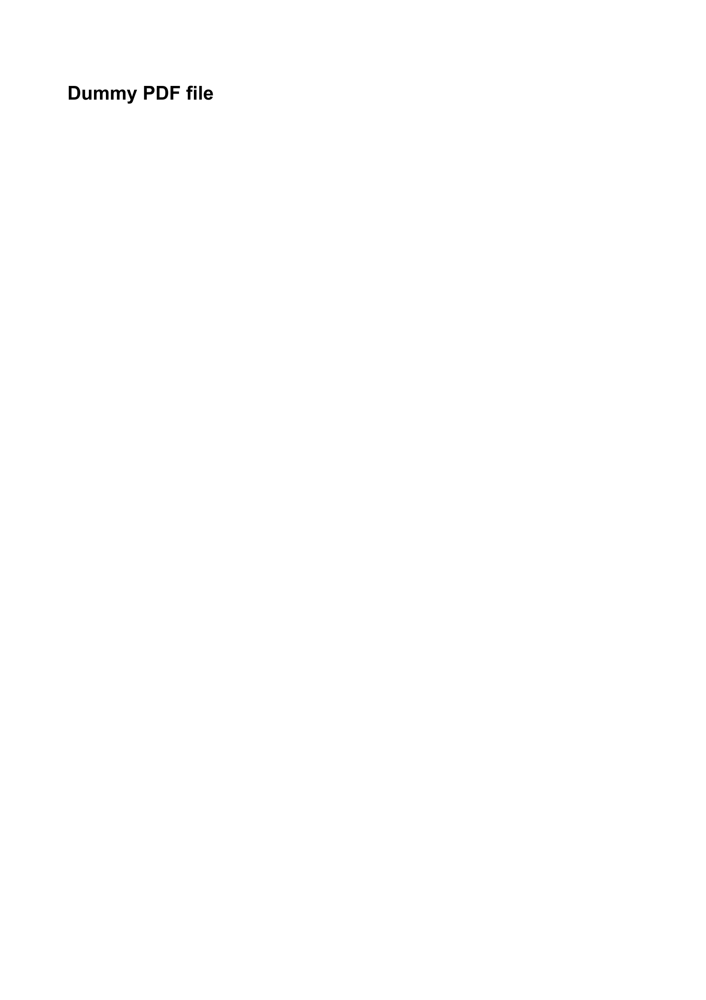

In [ ]:
display_pdf_as_images("/content/w3c_dummy.pdf")

# Download a real technical PDF

Let's use the original Attention Is All You Need paper.

In [ ]:
transformer_url = "https://arxiv.org/pdf/1706.03762"

download_pdf(
    transformer_url,
    "/content/attention_is_all_you_need.pdf"
)

Downloaded: /content/attention_is_all_you_need.pdf
Size: 2163.32 KB


Displaying PDF: /content/attention_is_all_you_need.pdf
Page 1:


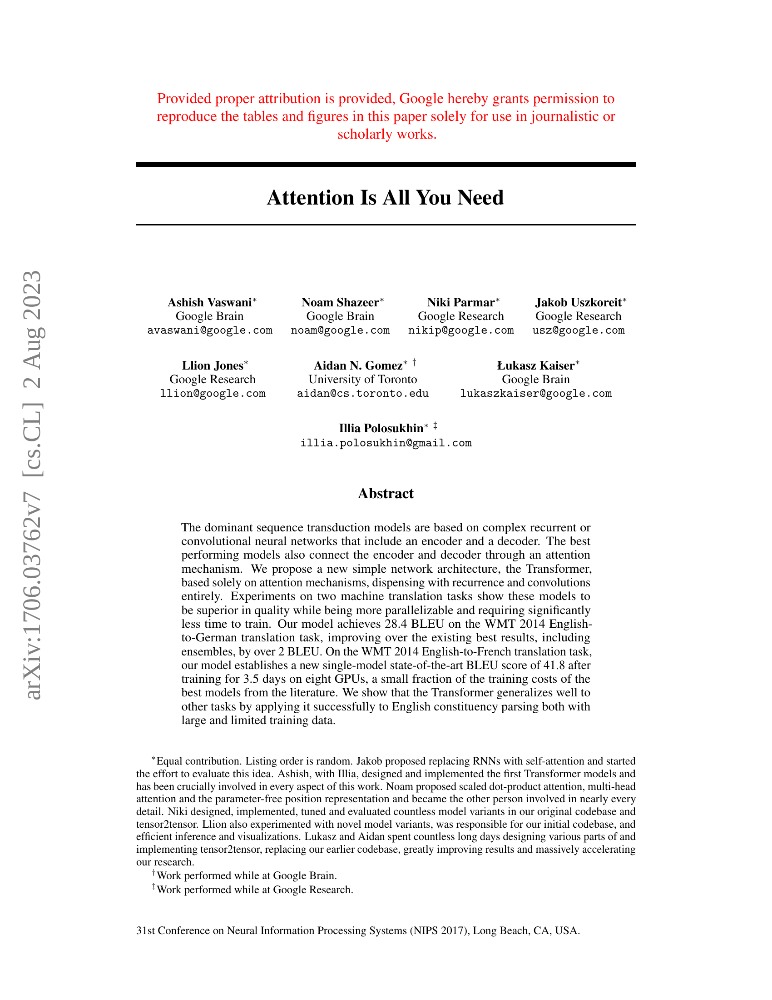

Page 2:


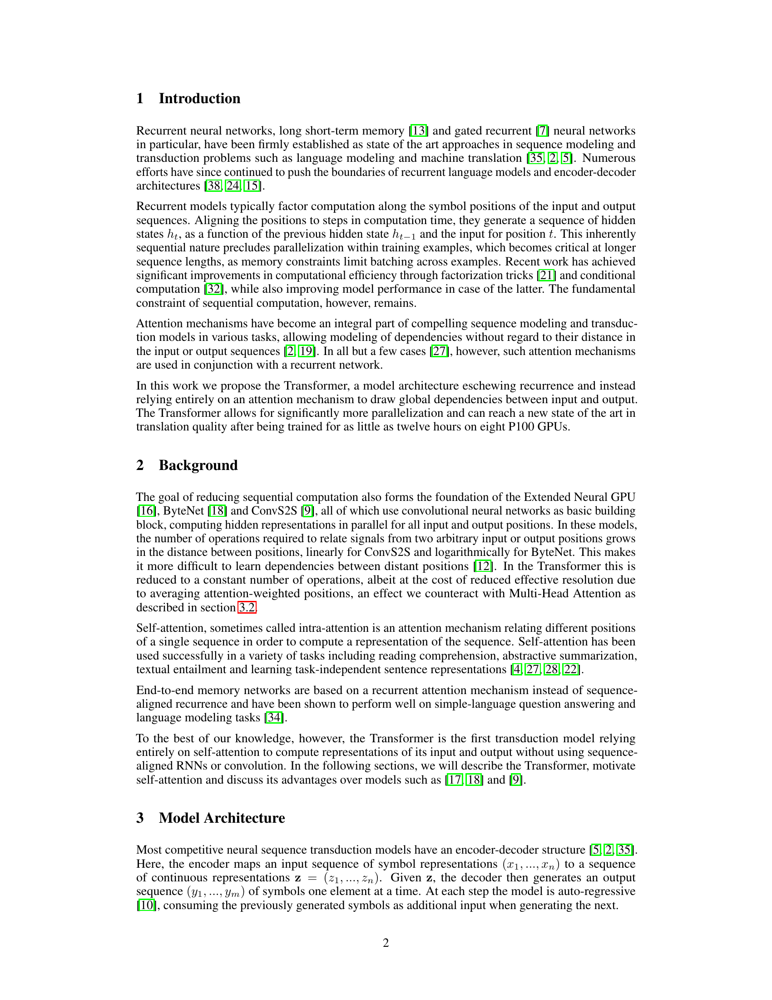

Page 3:


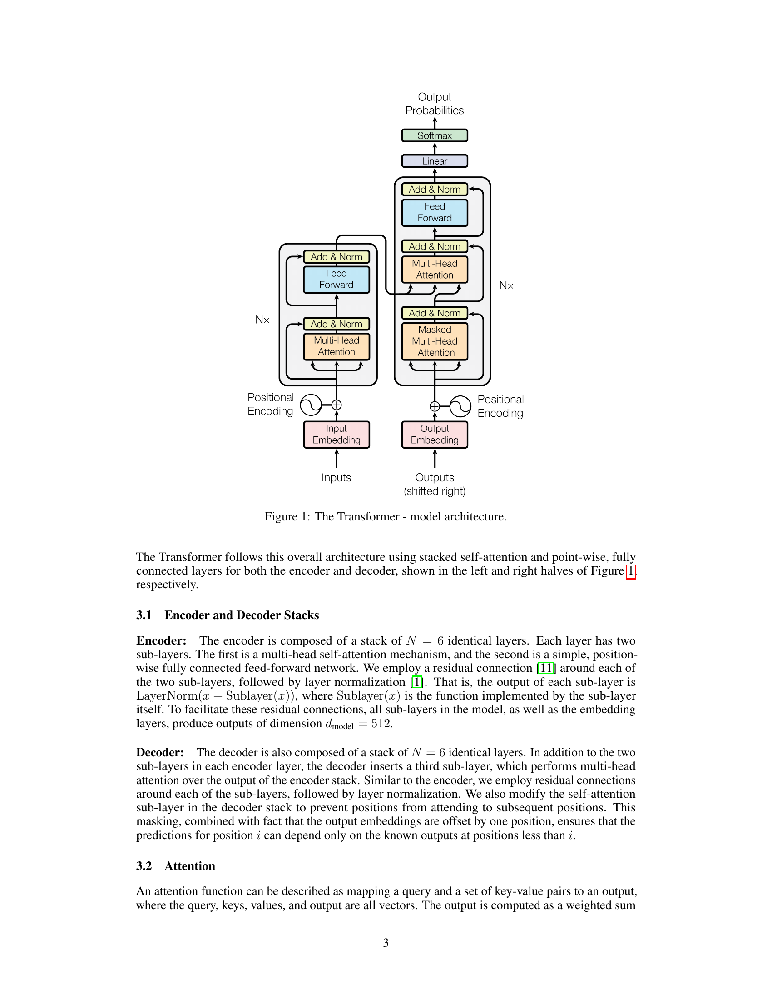

Page 4:


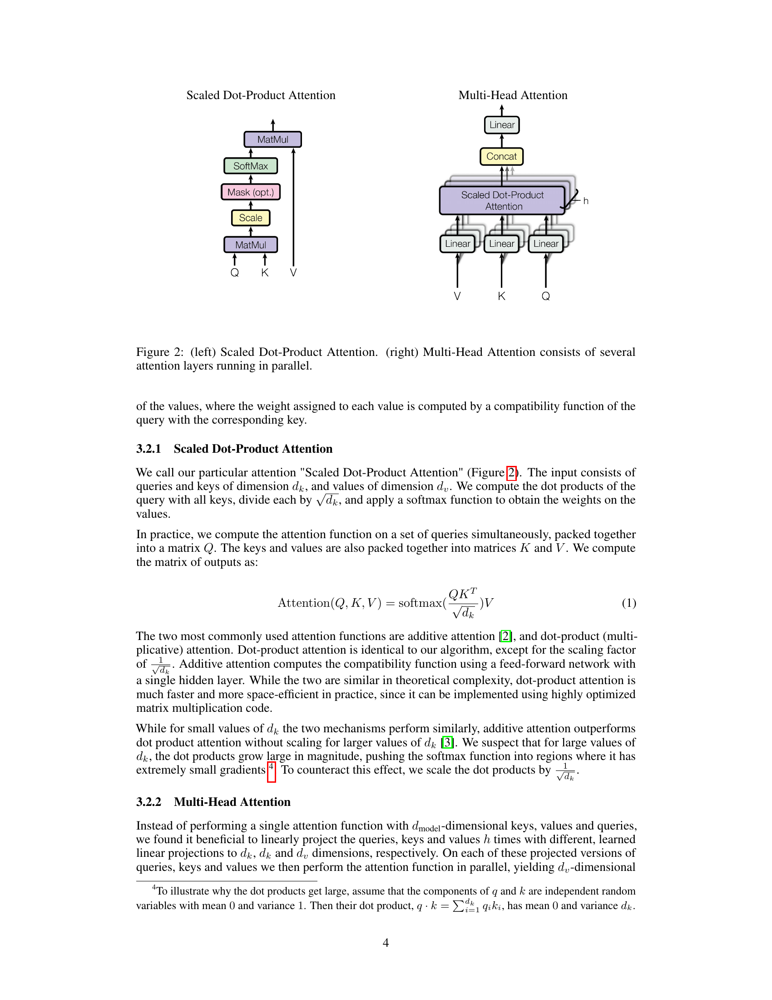

Page 5:


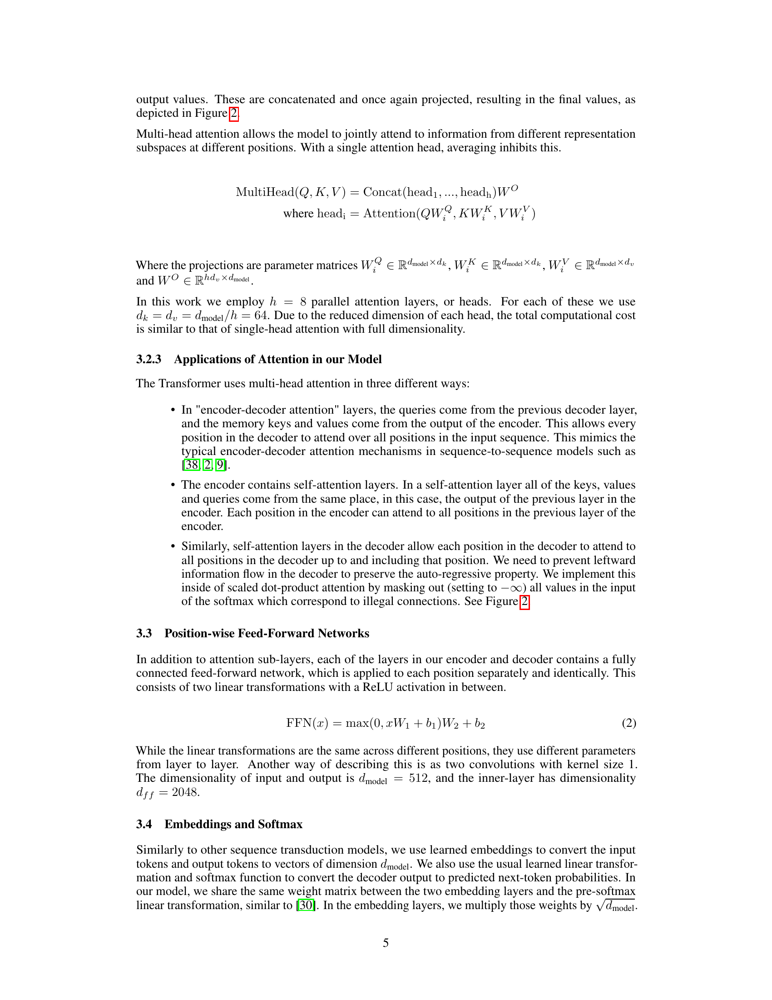

Page 6:


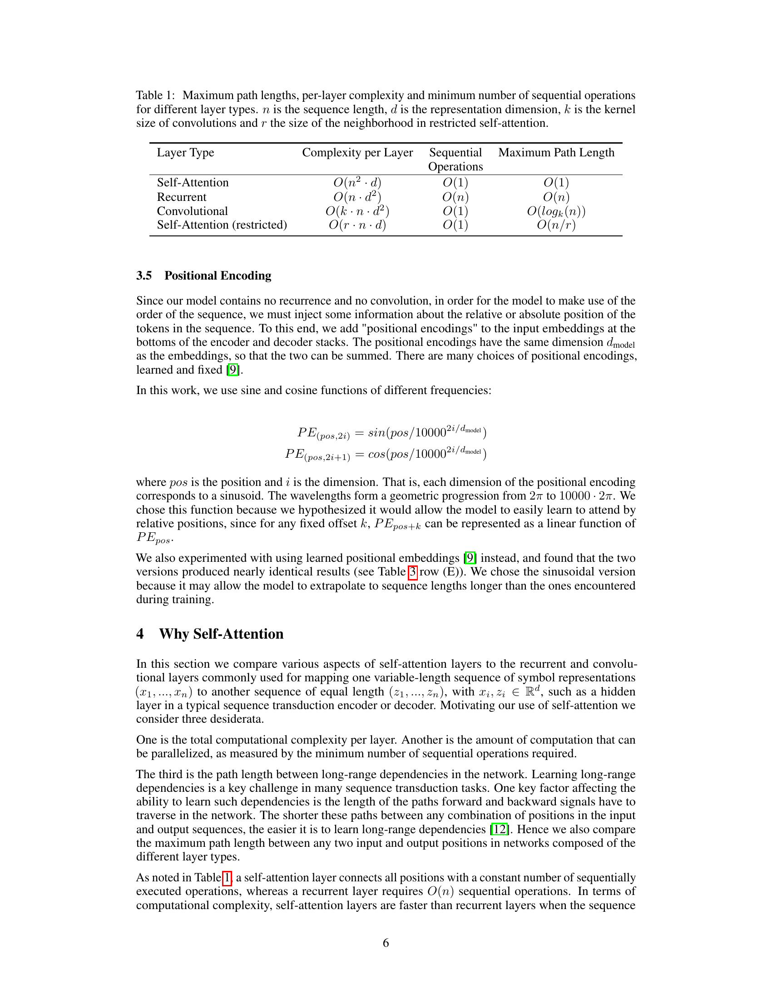

Page 7:


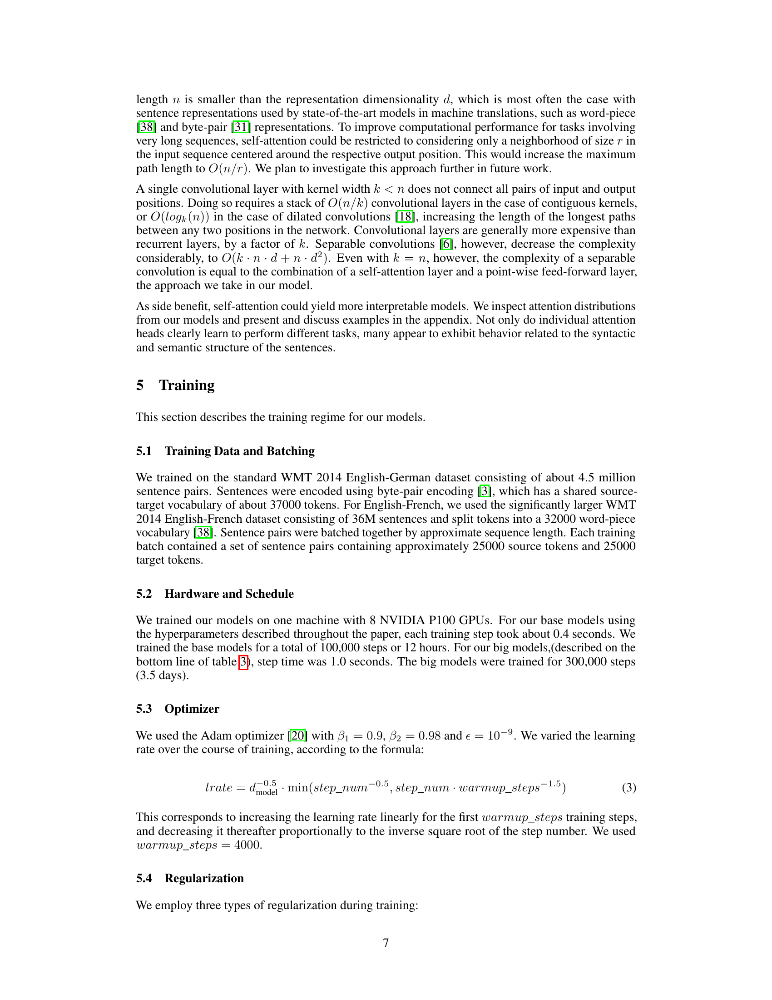

Page 8:


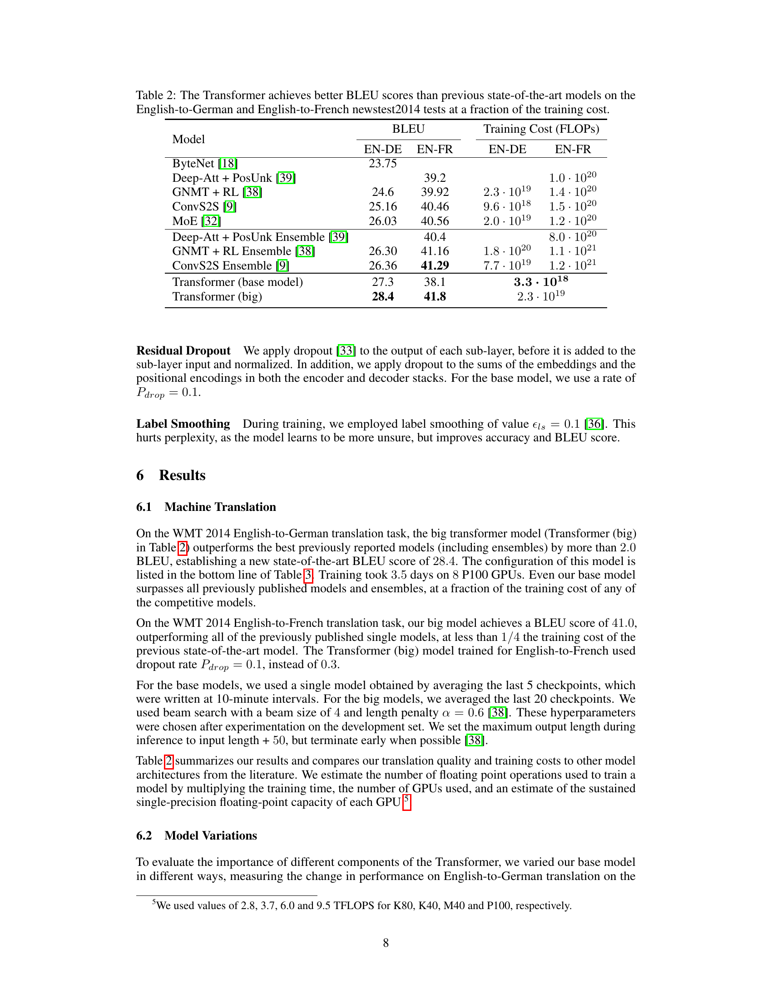

Page 9:


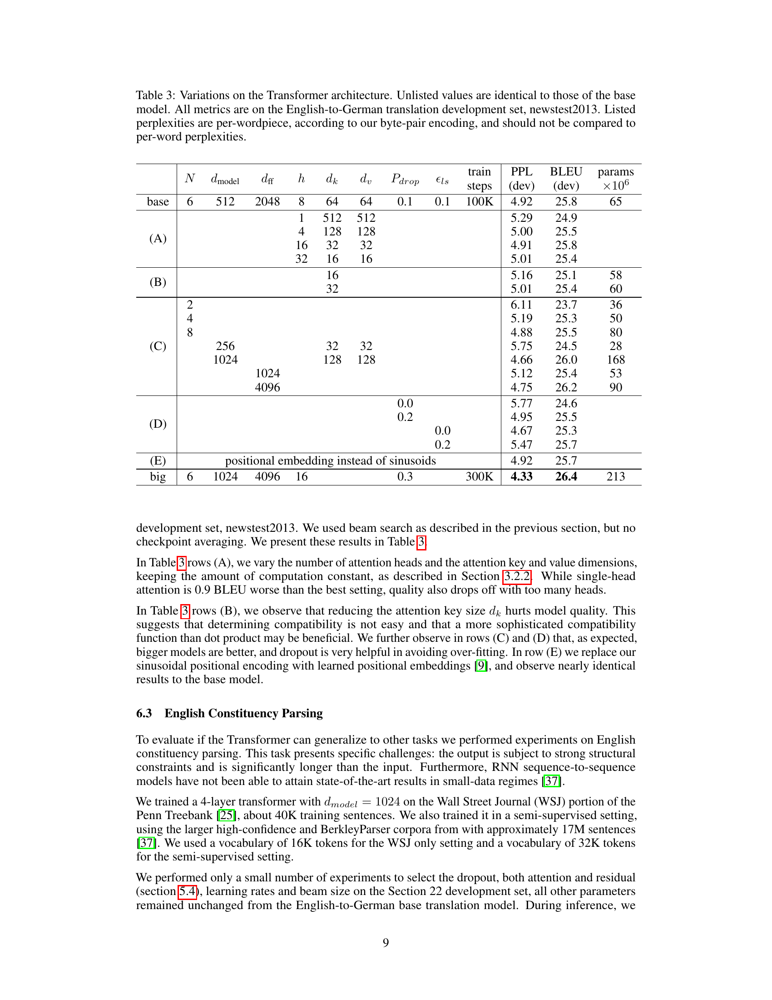

Page 10:


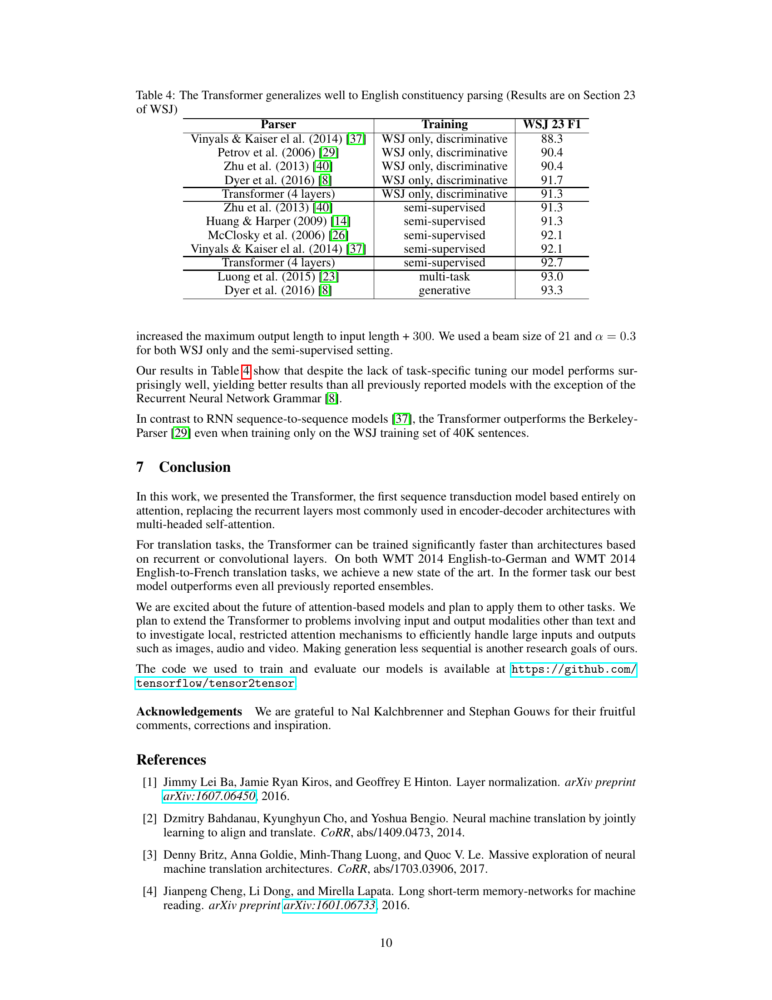

Page 11:


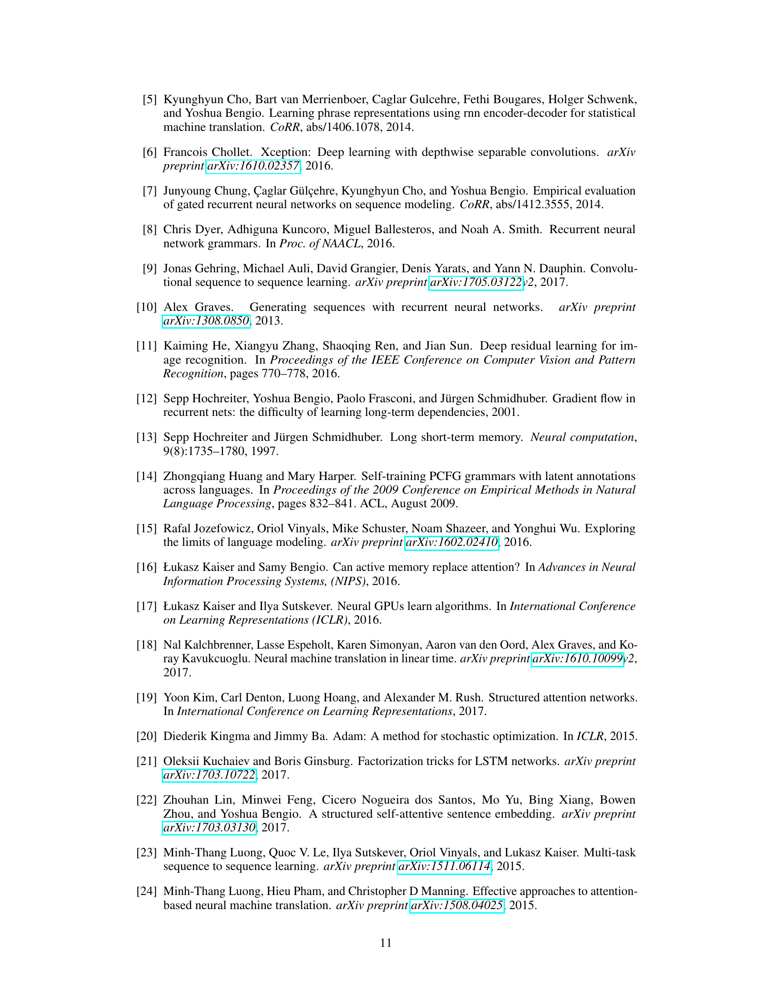

Page 12:


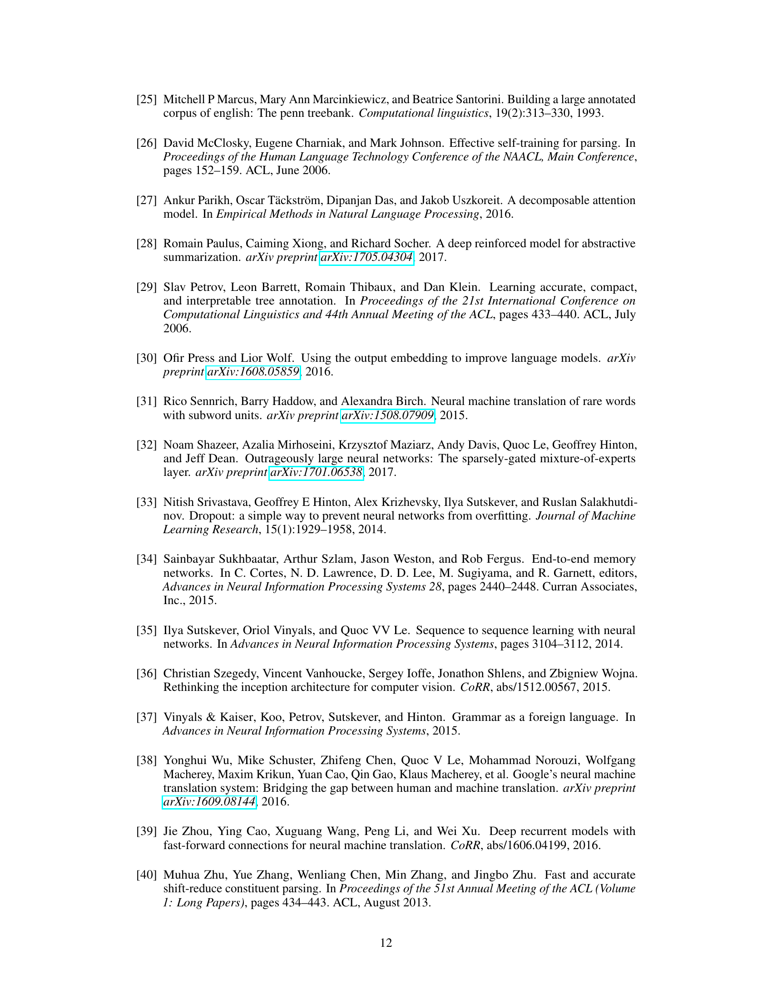

Page 13:


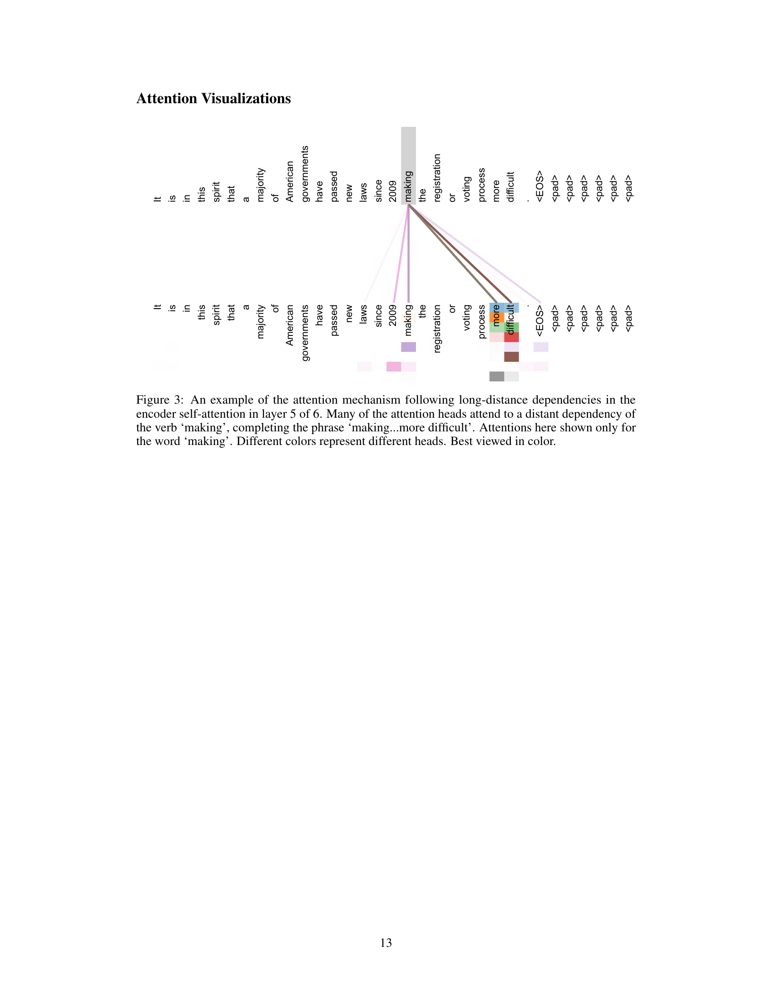

Page 14:


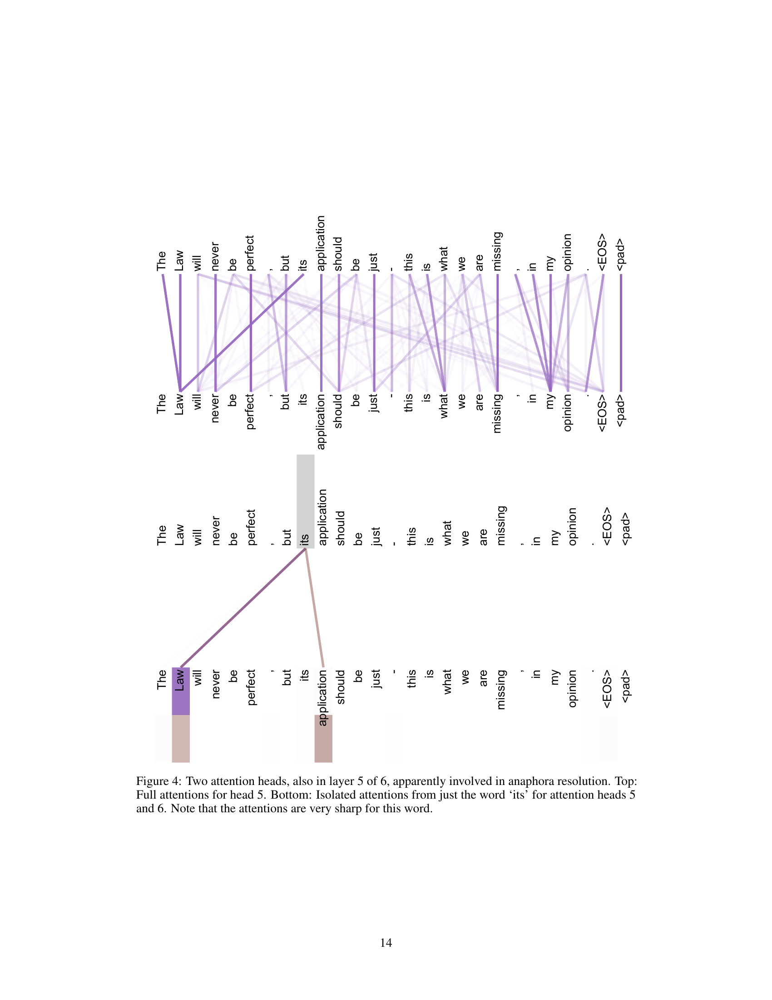

Page 15:


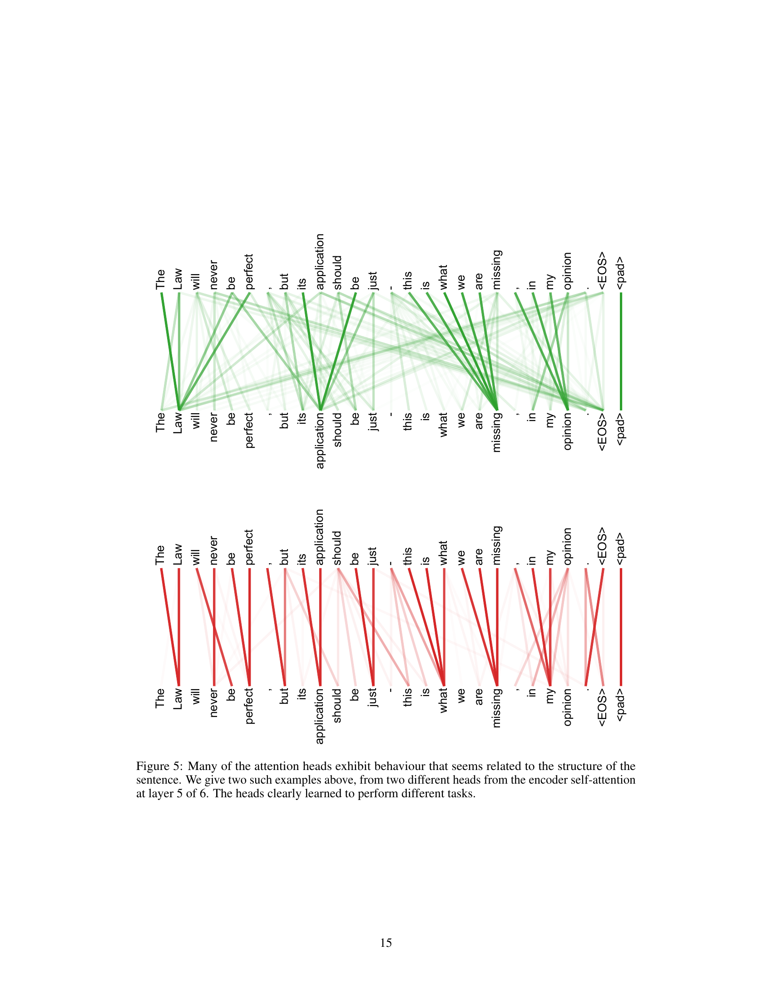

In [ ]:
display_pdf_as_images("/content/attention_is_all_you_need.pdf")

# **Create a PDF specifically for table testing**

In [ ]:
from reportlab.lib.pagesizes import letter
from reportlab.platypus import SimpleDocTemplate, Table, TableStyle, Paragraph, Spacer
from reportlab.lib import colors
from reportlab.lib.styles import getSampleStyleSheet

table_pdf = "/content/table_test.pdf"

styles = getSampleStyleSheet()

doc = SimpleDocTemplate(
    table_pdf,
    pagesize=letter
)

elements = []

elements.append(
    Paragraph(
        "UMT Program Fee Structure — 2026",
        styles["Title"]
    )
)

elements.append(Spacer(1, 20))

data = [
    ["Program", "Semester Fee", "Duration", "Eligibility"],
    ["BS Artificial Intelligence", "150,000 PKR", "4 Years", "50%"],
    ["BS Computer Science", "140,000 PKR", "4 Years", "50%"],
    ["BS Data Science", "145,000 PKR", "4 Years", "50%"],
]

table = Table(data)

table.setStyle(TableStyle([
    ("BACKGROUND", (0, 0), (-1, 0), colors.grey),
    ("TEXTCOLOR", (0, 0), (-1, 0), colors.white),
    ("GRID", (0, 0), (-1, -1), 1, colors.black),
    ("ALIGN", (1, 1), (-1, -1), "CENTER"),
    ("VALIGN", (0, 0), (-1, -1), "MIDDLE"),
]))

elements.append(table)

doc.build(elements)

print(table_pdf)

/content/table_test.pdf


Displaying PDF: /content/table_test.pdf
Page 1:


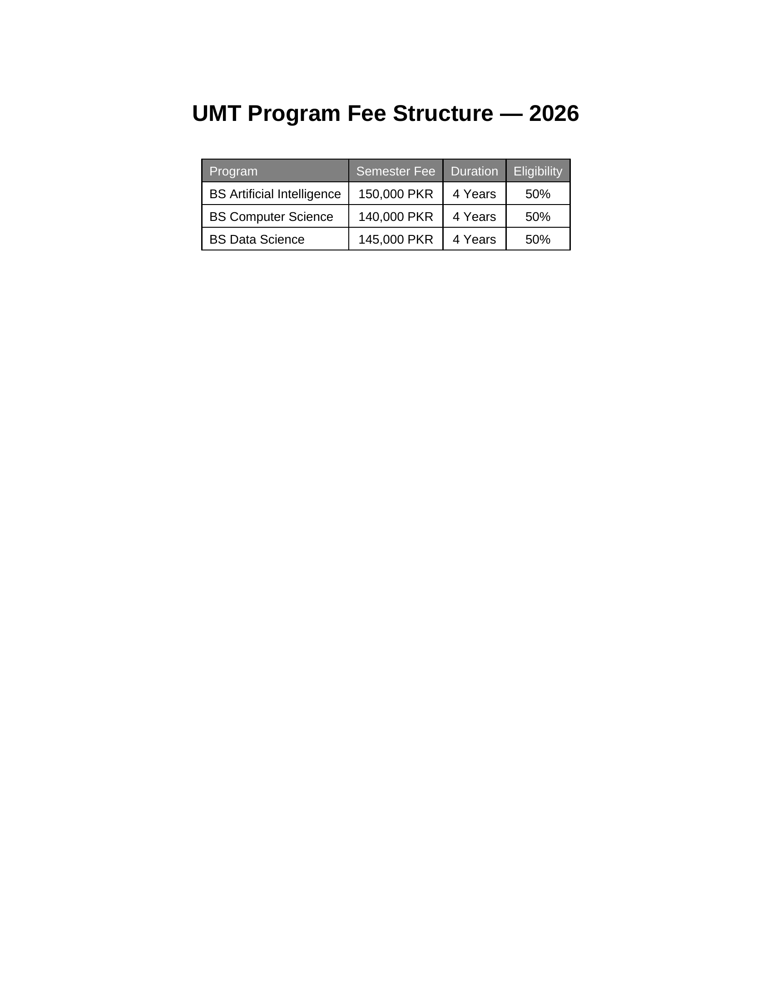

In [ ]:
display_pdf_as_images("/content/table_test.pdf")

# **Create an image-only/scanned-style PDF**

This is important because OCR should be tested separately.

Create an image

In [ ]:
from PIL import Image, ImageDraw

image_path = "/content/scanned_page.png"

img = Image.new("RGB", (1600, 2200), "white")
draw = ImageDraw.Draw(img)

lines = [
    "UMT Admissions 2026",
    "",
    "Eligibility",
    "",
    "Applicants must have at least 50 percent marks.",
    "",
    "BS Artificial Intelligence",
    "",
    "The program duration is four years.",
    "",
    "Semester fee: 150,000 PKR."
]

y = 200

for line in lines:
    draw.text((150, y), line, fill="black")
    y += 100

img.save(image_path)

print(image_path)

/content/scanned_page.png


Displaying PDF: /content/scanned.pdf
Page 1:


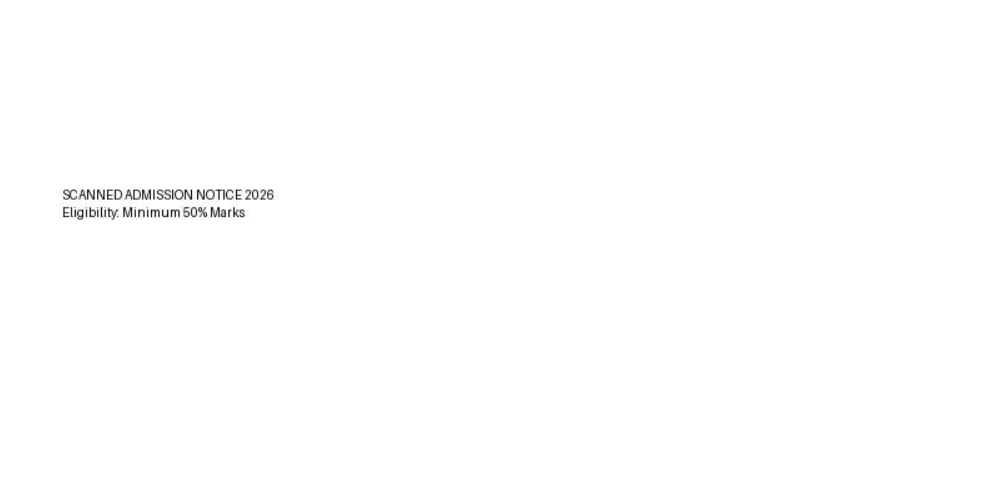

In [ ]:
display_pdf_as_images("/content/scanned.pdf")

# **Now convert that image into a PDF:**

In [ ]:
scanned_pdf = "/content/scanned_test.pdf"

img.convert("RGB").save(
    scanned_pdf,
    "PDF",
    resolution=150.0
)

print(scanned_pdf)

/content/scanned_test.pdf


Displaying PDF: /content/scanned_test.pdf
Page 1:


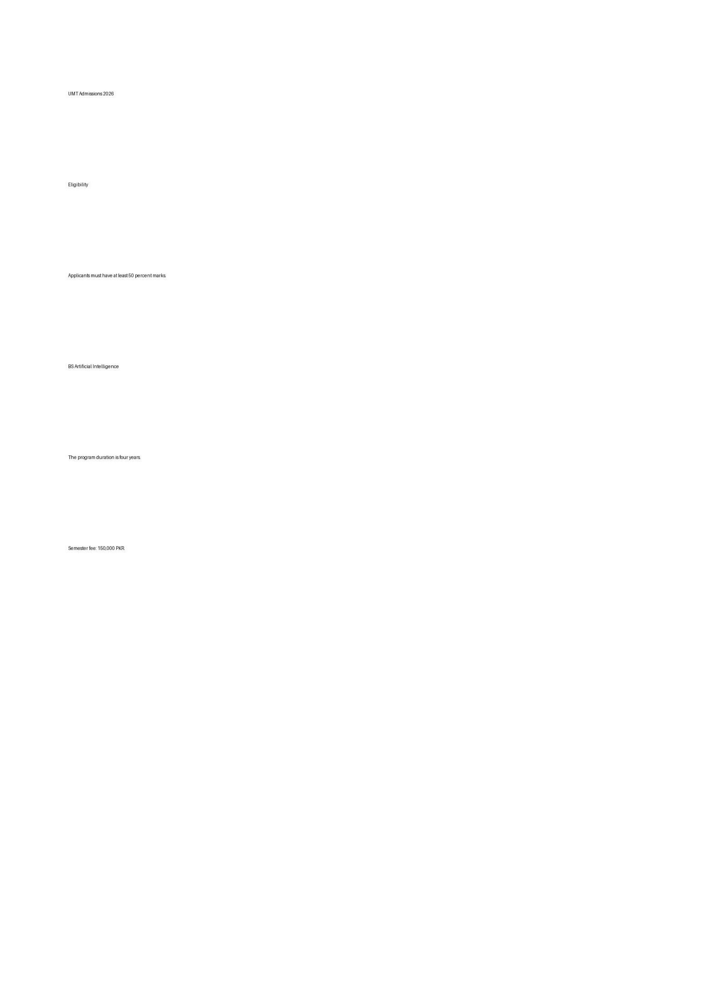

In [ ]:
display_pdf_as_images("/content/scanned_test.pdf")

#  Create a list of all PDFs

In [ ]:
pdf_files = {
    "W3C Dummy": "/content/w3c_dummy.pdf",
    "Transformer Paper": "/content/attention_is_all_you_need.pdf",
    "Table Test": "/content/table_test.pdf",
    "Scanned Test": "/content/scanned_test.pdf"
}

for name, path in pdf_files.items():
    print(f"{name}: {os.path.exists(path)}")

W3C Dummy: True
Transformer Paper: True
Table Test: True
Scanned Test: True


# **Basic PDF inspection**

In [ ]:
def inspect_pdf(path):
    reader = PdfReader(path)

    print("=" * 70)
    print("FILE:", path)
    print("PAGES:", len(reader.pages))
    print("=" * 70)

    for i, page in enumerate(reader.pages[:3], start=1):
        text = page.extract_text() or ""

        print(f"\n--- PAGE {i} ---")
        print("Characters:", len(text))
        print(text[:1000])

In [ ]:
inspect_pdf(pdf_files["Transformer Paper"])

FILE: /content/attention_is_all_you_need.pdf
PAGES: 15

--- PAGE 1 ---
Characters: 2857
Provided proper attribution is provided, Google hereby grants permission to
reproduce the tables and figures in this paper solely for use in journalistic or
scholarly works.
Attention Is All You Need
Ashish Vaswani∗
Google Brain
avaswani@google.com
Noam Shazeer∗
Google Brain
noam@google.com
Niki Parmar∗
Google Research
nikip@google.com
Jakob Uszkoreit∗
Google Research
usz@google.com
Llion Jones∗
Google Research
llion@google.com
Aidan N. Gomez∗†
University of Toronto
aidan@cs.toronto.edu
Łukasz Kaiser∗
Google Brain
lukaszkaiser@google.com
Illia Polosukhin∗‡
illia.polosukhin@gmail.com
Abstract
The dominant sequence transduction models are based on complex recurrent or
convolutional neural networks that include an encoder and a decoder. The best
performing models also connect the encoder and decoder through an attention
mechanism. We propose a new simple network architecture, the Transformer,
based sol

In [ ]:
inspect_pdf(pdf_files["Scanned Test"])

FILE: /content/scanned_test.pdf
PAGES: 1

--- PAGE 1 ---
Characters: 0



# **Detect pages requiring OCR**

In [ ]:
def inspect_pdf_text_layer(path, threshold=20):

    reader = PdfReader(path)
    results = []

    for page_number, page in enumerate(reader.pages, start=1):

        text = (page.extract_text() or "").strip()

        results.append({
            "page": page_number,
            "characters": len(text),
            "has_text": len(text) > threshold,
            "needs_ocr": len(text) <= threshold
        })

    return results

In [ ]:
inspection = inspect_pdf_text_layer(
    pdf_files["Scanned Test"]
)

for item in inspection:
    print(item)

{'page': 1, 'characters': 0, 'has_text': False, 'needs_ocr': True}


# **OCR only the pages that need it**

Convert PDF pages into images:**

In [ ]:
def ocr_pdf(path, dpi=200):

    pages = convert_from_path(
        path,
        dpi=dpi
    )

    results = []

    inspection = inspect_pdf_text_layer(path)

    for info, image in zip(inspection, pages):

        if info["needs_ocr"]:

            text = pytesseract.image_to_string(image)

            results.append({
                "page": info["page"],
                "text": text,
                "is_ocr": True
            })

        else:

            reader = PdfReader(path)
            text = reader.pages[
                info["page"] - 1
            ].extract_text() or ""

            results.append({
                "page": info["page"],
                "text": text,
                "is_ocr": False
            })

    return results

In [ ]:
ocr_results = ocr_pdf(
    pdf_files["Scanned Test"]
)

for result in ocr_results:
    print("=" * 60)
    print("PAGE:", result["page"])
    print("OCR:", result["is_ocr"])
    print(result["text"][:1500])

PAGE: 1
OCR: True
UMT Admissions 2026

Eligibility

Applicants must have at least 50 percent marks.

BS Artificial Intelligence

‘The program duration is four years.

‘Semester fee: 150,000 PKR



# **Detect repeated headers/footers**

For a real multi-page PDF such as the Transformer paper:

In [ ]:
def collect_page_lines(path):

    reader = PdfReader(path)

    page_lines = []

    for page in reader.pages:

        text = page.extract_text() or ""

        lines = [
            line.strip()
            for line in text.splitlines()
            if line.strip()
        ]

        page_lines.append(lines)

    return page_lines

In [ ]:
def find_repeated_lines(path):

    page_lines = collect_page_lines(path)

    counter = Counter()

    for lines in page_lines:
        for line in set(lines):
            counter[line] += 1

    threshold = max(
        2,
        len(page_lines) // 2
    )

    repeated = {
        line: count
        for line, count in counter.items()
        if count >= threshold
    }

    return repeated

In [ ]:
repeated = find_repeated_lines(
    pdf_files["Transformer Paper"]
)

for line, count in repeated.items():
    print(count, "pages:", repr(line))

# **Remove confirmed boilerplate**

In [ ]:
def remove_repeated_lines(text, repeated_lines):

    output = []

    for line in text.splitlines():

        if line.strip() in repeated_lines:
            continue

        output.append(line)

    return "\n".join(output)

In [ ]:
inspect_pdf(
    pdf_files["Table Test"]
)

FILE: /content/table_test.pdf
PAGES: 1

--- PAGE 1 ---
Characters: 210
UMT Program Fee Structure — 2026
Program
Semester Fee
Duration
Eligibility
BS Artificial Intelligence
150,000 PKR
4 Years
50%
BS Computer Science
140,000 PKR
4 Years
50%
BS Data Science
145,000 PKR
4 Years
50%



# **Detect pages containing images**

In [ ]:
def detect_images(path):

    reader = PdfReader(path)

    results = []

    for page_number, page in enumerate(
        reader.pages,
        start=1
    ):

        has_images = False

        try:
            if "/XObject" in page["/Resources"]:
                xobjects = page["/Resources"]["/XObject"].get_object()

                for obj in xobjects:
                    if xobjects[obj].get_object()["/Subtype"] == "/Image":
                        has_images = True
                        break

        except Exception:
            pass

        results.append({
            "page": page_number,
            "has_images": has_images
        })

    return results

In [ ]:
image_report = detect_images(
    pdf_files["Transformer Paper"]
)

for item in image_report:
    if item["has_images"]:
        print(item)

{'page': 3, 'has_images': True}
{'page': 4, 'has_images': True}


# **Standardized page documents**

In [ ]:
from dataclasses import dataclass, field

@dataclass
class Document:
    text: str
    metadata: dict = field(default_factory=dict)

# **Create page-aware extraction:**

In [ ]:
def extract_pdf_documents(path):

    reader = PdfReader(path)

    image_report = {
        item["page"]: item["has_images"]
        for item in detect_images(path)
    }

    inspection = inspect_pdf_text_layer(path)

    documents = []

    for info in inspection:

        page_number = info["page"]

        if info["needs_ocr"]:

            pages = convert_from_path(
                path,
                dpi=200,
                first_page=page_number,
                last_page=page_number
            )

            text = pytesseract.image_to_string(
                pages[0]
            )

            is_ocr = True

        else:

            text = (
                reader.pages[page_number - 1]
                .extract_text()
                or ""
            )

            is_ocr = False

        documents.append(
            Document(
                text=text,
                metadata={
                    "source": path,
                    "type": "pdf",
                    "page": page_number,
                    "is_ocr": is_ocr,
                    "has_images": image_report.get(
                        page_number,
                        False
                    )
                }
            )
        )

    return documents

In [ ]:
docs = extract_pdf_documents(
    pdf_files["Scanned Test"]
)

for doc in docs:
    print(doc.metadata)
    print(doc.text[:1000])
    print("-" * 60)

{'source': '/content/scanned_test.pdf', 'type': 'pdf', 'page': 1, 'is_ocr': True, 'has_images': True}
UMT Admissions 2026

Eligibility

Applicants must have at least 50 percent marks.

BS Artificial Intelligence

‘The program duration is four years.

‘Semester fee: 150,000 PKR

------------------------------------------------------------


# **Quality report**

In [ ]:
def pdf_quality_report(path):

    reader = PdfReader(path)

    text_pages = 0
    ocr_candidates = 0
    total_characters = 0

    inspection = inspect_pdf_text_layer(path)

    for info in inspection:

        total_characters += info["characters"]

        if info["has_text"]:
            text_pages += 1
        else:
            ocr_candidates += 1

    image_info = detect_images(path)

    image_pages = sum(
        item["has_images"]
        for item in image_info
    )

    return {
        "source": path,
        "pages": len(reader.pages),
        "text_pages": text_pages,
        "ocr_candidates": ocr_candidates,
        "image_pages": image_pages,
        "total_characters": total_characters
    }

In [ ]:
for name, path in pdf_files.items():

    print("\n", name)

    report = pdf_quality_report(path)

    for key, value in report.items():
        print(f"{key}: {value}")


 W3C Dummy
source: /content/w3c_dummy.pdf
pages: 1
text_pages: 0
ocr_candidates: 1
image_pages: 0
total_characters: 14

 Transformer Paper
source: /content/attention_is_all_you_need.pdf
pages: 15
text_pages: 15
ocr_candidates: 0
image_pages: 2
total_characters: 39496

 Table Test
source: /content/table_test.pdf
pages: 1
text_pages: 1
ocr_candidates: 0
image_pages: 0
total_characters: 209

 Scanned Test
source: /content/scanned_test.pdf
pages: 1
text_pages: 0
ocr_candidates: 1
image_pages: 1
total_characters: 0


# **Phase 2C — Web Ingestion**

1. URL downloading
2. HTML parsing
3. Title extraction
4. Heading extraction
5. Paragraph extraction
6. Link extraction
7. Navigation removal
8. Header/footer removal
9. Script/style removal
10. Boilerplate detection
11. URL metadata
12. Source metadata
13. Duplicate-page detection
14. Clean Document objects

In [ ]:
!pip -q install requests beautifulsoup4 lxml

In [ ]:
import re
import hashlib
import requests

from bs4 import BeautifulSoup
from urllib.parse import urljoin, urlparse

In [ ]:
url="https://www.w3schools.com/python/python_intro.asp"

In [ ]:
response = requests.get(
    url,
    timeout=30,
    headers={
        "User-Agent": "Mozilla/5.0"
    }
)

print("Status:", response.status_code)
print("Content-Type:", response.headers.get("content-type"))
print("Characters:", len(response.text))

Status: 200
Content-Type: text/html
Characters: 221249


# **Parse HTML**

In [ ]:
html = response.text

soup = BeautifulSoup(html, "lxml")

print(soup.title)

<title>Introduction to Python</title>


In [ ]:
title = soup.title.get_text(strip=True) if soup.title else ""

print(title)

Introduction to Python


# **Remove obvious non-content elements**

In [ ]:
for tag in soup([
    "script",
    "style",
    "noscript",
    "svg"
]):
    tag.decompose()

# **Extract headings**

In [ ]:
headings = []

for tag in soup.find_all(["h1", "h2", "h3", "h4"]):
    text = tag.get_text(" ", strip=True)

    if text:
        headings.append({
            "level": tag.name,
            "text": text
        })

headings[:10]

[{'level': 'h1', 'text': 'Tutorials'},
 {'level': 'h1', 'text': 'Tutorials'},
 {'level': 'h2', 'text': 'W3SCHOOLS TUTORIALS:'},
 {'level': 'h1', 'text': 'References'},
 {'level': 'h2', 'text': 'W3SCHOOLS REFERENCES:'},
 {'level': 'h4', 'text': 'HTML'},
 {'level': 'h4', 'text': 'CSS'},
 {'level': 'h4', 'text': 'JavaScript'},
 {'level': 'h4', 'text': 'SQL'},
 {'level': 'h4', 'text': 'Python'}]

# **Extract paragraphs**

In [ ]:
paragraphs = []

for tag in soup.find_all("p"):
    text = tag.get_text(" ", strip=True)

    if text:
        paragraphs.append(text)

print("\n".join(paragraphs[:10]))

Learn web development, programming, data science, and more.
Tag reference
Reference
Reference
Keyword reference
Reference
Reference
Reference
Reference
Color names


# Extract links

In [ ]:
links = []

for a in soup.find_all("a", href=True):

    text = a.get_text(" ", strip=True)

    href = urljoin(url, a["href"])

    if text:
        links.append({
            "text": text,
            "url": href
        })

links[:10]

[{'text': 'Tutorials',
  'url': 'https://www.w3schools.com/python/python_intro.asp'},
 {'text': 'References',
  'url': 'https://www.w3schools.com/python/python_intro.asp'},
 {'text': 'Exercises',
  'url': 'https://www.w3schools.com/python/python_intro.asp'},
 {'text': 'Certificates',
  'url': 'https://www.w3schools.com/python/python_intro.asp'},
 {'text': 'Menu', 'url': 'https://www.w3schools.com/python/python_intro.asp'},
 {'text': 'See More',
  'url': 'https://www.w3schools.com/python/python_intro.asp'},
 {'text': '★ +1', 'url': 'https://profile.w3schools.com/log-in'},
 {'text': 'Get Certified',
  'url': 'https://campus.w3schools.com/collections/course-catalog'},
 {'text': 'Upgrade', 'url': 'https://order.w3schools.com/plans'},
 {'text': 'Academy', 'url': 'https://www.w3schools.com/academy/index.php'}]

# **Identify navigation / boilerplate**

In [ ]:
for tag in soup.find_all(
    ["nav", "header", "footer", "aside"]
):
    print(tag.name, tag.get_text(" ", strip=True)[:300])

nav Tutorials References Exercises Certificates
nav  My W3Schools Tutorials References Exercises Certificates Spaces Get Certified Plus Practice Academy All our Services Logout     ×
nav × Tutorials Tutorials Learn web development, programming, data science, and more. W3SCHOOLS TUTORIALS: × ← All Topics
nav × References W3SCHOOLS REFERENCES: × HTML Tag reference CSS Reference JavaScript Reference SQL Keyword reference Python Reference Java Reference C Reference C++ Reference Colors Color names PHP Reference HTML DOM Reference MySQL Reference W3.CSS Reference Bootstrap 3 Reference Bootstrap 4 Reference 
nav × Exercises Practice and test your skills with different exercises. Tip: Sign in to track your progress. Select another topic: × HTML Exercises CSS Exercises JavaScript Exercises SQL Exercises Python Exercises Java Exercises C Exercises C++ Exercises C# Exercises PHP Exercises React Exercises MySQL 
nav × Get Certified W3SCHOOLS CERTIFICATES: × HTML CSS JavaScript SQL Python Jav

# Remove obvious boilerplate

In [ ]:
for tag in soup.find_all(
    ["nav", "header", "footer", "aside"]
):
    tag.decompose()

In [ ]:
clean_text = soup.get_text(
    separator="\n",
    strip=True
)

print(clean_text[:3000])

Introduction to Python
Menu
Search field
×
See More
Sign In
★
+1
Get Certified
Upgrade
Academy
Spaces
Practice
Get Certified
Upgrade
Academy
Spaces
Practice
❮
❯
HTML
CSS
JAVASCRIPT
SQL
PYTHON
JAVA
PHP
W3.CSS
C
C++
C#
HOW TO
BOOTSTRAP
REACT
MYSQL
JQUERY
EXCEL
XML
DJANGO
NUMPY
PANDAS
NODEJS
DSA
TYPESCRIPT
ANGULAR
ANGULARJS
GIT
POSTGRESQL
MONGODB
ASP
AI
R
GO
KOTLIN
SWIFT
SASS
VUE
GEN AI
SCIPY
AWS
CYBERSECURITY
DATA SCIENCE
INTRO TO PROGRAMMING
INTRO TO HTML & CSS
BASH
RUST
TOOLS
Python
Tutorial
Python HOME
Python Intro
Python Get Started
Python Syntax
Syntax
Statements
Code Challenge
Python Output
Print Text
Print Numbers
Code Challenge
Python Comments
Comments
Code Challenge
Python Variables
Python Variables
Variable Names
Assign Multiple Values
Output Variables
Global Variables
Variable Exercises
Code Challenge
Python Data Types
Data Types
Code Challenge
Python Numbers
Numbers
Code Challenge
Python Casting
Casting
Code Challenge
Python Strings
Python Strings
Slicing Strings
Modify Strin

# **Normalize whitespace**

In [ ]:
def normalize_web_text(text):

    text = text.replace("\r\n", "\n")
    text = text.replace("\r", "\n")

    text = re.sub(
        r"[ \t]+",
        " ",
        text
    )

    text = re.sub(
        r"\n\s*\n+",
        "\n\n",
        text
    )

    return text.strip()

In [ ]:
def normalize_web_text(text):

    text = text.replace("\r\n", "\n")
    text = text.replace("\r", "\n")

    text = re.sub(
        r"[ \t]+",
        " ",
        text
    )

    text = re.sub(
        r"\n\s*\n+",
        "\n\n",
        text
    )

    return text.strip()

In [ ]:
clean_text = normalize_web_text(clean_text)

print(clean_text[:3000])

Introduction to Python
Menu
Search field
×
See More
Sign In
★
+1
Get Certified
Upgrade
Academy
Spaces
Practice
Get Certified
Upgrade
Academy
Spaces
Practice
❮
❯
HTML
CSS
JAVASCRIPT
SQL
PYTHON
JAVA
PHP
W3.CSS
C
C++
C#
HOW TO
BOOTSTRAP
REACT
MYSQL
JQUERY
EXCEL
XML
DJANGO
NUMPY
PANDAS
NODEJS
DSA
TYPESCRIPT
ANGULAR
ANGULARJS
GIT
POSTGRESQL
MONGODB
ASP
AI
R
GO
KOTLIN
SWIFT
SASS
VUE
GEN AI
SCIPY
AWS
CYBERSECURITY
DATA SCIENCE
INTRO TO PROGRAMMING
INTRO TO HTML & CSS
BASH
RUST
TOOLS
Python
Tutorial
Python HOME
Python Intro
Python Get Started
Python Syntax
Syntax
Statements
Code Challenge
Python Output
Print Text
Print Numbers
Code Challenge
Python Comments
Comments
Code Challenge
Python Variables
Python Variables
Variable Names
Assign Multiple Values
Output Variables
Global Variables
Variable Exercises
Code Challenge
Python Data Types
Data Types
Code Challenge
Python Numbers
Numbers
Code Challenge
Python Casting
Casting
Code Challenge
Python Strings
Python Strings
Slicing Strings
Modify Strin

In [ ]:
from dataclasses import dataclass, field

@dataclass
class Document:
    text: str
    metadata: dict = field(default_factory=dict)

In [ ]:
web_doc = Document(
    text=clean_text,
    metadata={
        "source": url,
        "type": "html",
        "title": title,
        "language": "unknown"
    }
)

print(web_doc.metadata)
print(web_doc.text[:1000])

{'source': 'https://www.w3schools.com/python/python_intro.asp', 'type': 'html', 'title': 'Introduction to Python', 'language': 'unknown'}
Introduction to Python
Menu
Search field
×
See More
Sign In
★
+1
Get Certified
Upgrade
Academy
Spaces
Practice
Get Certified
Upgrade
Academy
Spaces
Practice
❮
❯
HTML
CSS
JAVASCRIPT
SQL
PYTHON
JAVA
PHP
W3.CSS
C
C++
C#
HOW TO
BOOTSTRAP
REACT
MYSQL
JQUERY
EXCEL
XML
DJANGO
NUMPY
PANDAS
NODEJS
DSA
TYPESCRIPT
ANGULAR
ANGULARJS
GIT
POSTGRESQL
MONGODB
ASP
AI
R
GO
KOTLIN
SWIFT
SASS
VUE
GEN AI
SCIPY
AWS
CYBERSECURITY
DATA SCIENCE
INTRO TO PROGRAMMING
INTRO TO HTML & CSS
BASH
RUST
TOOLS
Python
Tutorial
Python HOME
Python Intro
Python Get Started
Python Syntax
Syntax
Statements
Code Challenge
Python Output
Print Text
Print Numbers
Code Challenge
Python Comments
Comments
Code Challenge
Python Variables
Python Variables
Variable Names
Assign Multiple Values
Output Variables
Global Variables
Variable Exercises
Code Challenge
Python Data Types
Data Types
Code Challe

parsed = urlparse(url)

domain = parsed.netloc
path = parsed.path

print("Domain:", domain)
print("Path:", path)

In [ ]:
parsed = urlparse(url)

domain = parsed.netloc
path = parsed.path

print("Domain:", domain)
print("Path:", path)

Domain: www.w3schools.com
Path: /python/python_intro.asp


In [ ]:
web_doc.metadata.update({
    "domain": domain,
    "path": path
})

# **Step 13 — Preserve headings**

Don't just store flat text.

Create structured sections:**

In [ ]:
sections = []

for tag in soup.find_all(["h1", "h2", "h3"]):

    heading = tag.get_text(" ", strip=True)

    if not heading:
        continue

    content = []

    for sibling in tag.find_next_siblings():

        if sibling.name in ["h1", "h2", "h3"]:
            break

        if sibling.name == "p":
            text = sibling.get_text(" ", strip=True)

            if text:
                content.append(text)

    sections.append({
        "heading": heading,
        "text": "\n".join(content)
    })

In [ ]:
for section in sections[:5]:
    print("=" * 50)
    print(section["heading"])
    print(section["text"][:500])

Python Tutorial

Python Classes

File Handling

Python Modules

Python Matplotlib



In [ ]:
def content_hash(text):

    normalized = re.sub(
        r"\s+",
        " ",
        text.lower()
    ).strip()

    return hashlib.sha256(
        normalized.encode("utf-8")
    ).hexdigest()

In [ ]:
web_doc.metadata["content_hash"] = content_hash(
    web_doc.text
)

# **Build a reusable web loader**

In [ ]:
def load_webpage(url):

    response = requests.get(
        url,
        timeout=30,
        headers={
            "User-Agent": "Mozilla/5.0"
        }
    )

    response.raise_for_status()

    soup = BeautifulSoup(
        response.text,
        "lxml"
    )

    title = (
        soup.title.get_text(strip=True)
        if soup.title
        else ""
    )

    for tag in soup([
        "script",
        "style",
        "noscript",
        "svg",
        "nav",
        "header",
        "footer",
        "aside"
    ]):
        tag.decompose()

    text = soup.get_text(
        separator="\n",
        strip=True
    )

    text = normalize_web_text(text)

    parsed = urlparse(url)

    links = []

    for a in soup.find_all("a", href=True):

        anchor = a.get_text(
            " ",
            strip=True
        )

        href = urljoin(
            url,
            a["href"]
        )

        if anchor:
            links.append({
                "text": anchor,
                "url": href
            })

    return Document(
        text=text,
        metadata={
            "source": url,
            "type": "html",
            "title": title,
            "domain": parsed.netloc,
            "path": parsed.path,
            "links": links,
            "content_hash": content_hash(text)
        }
    )

In [ ]:
doc = load_webpage("https://www.w3.org/")

print(doc.metadata["title"])
print(doc.metadata["domain"])
print(doc.text[:2000])

W3C
www.w3.org
W3C
Skip to content
Making the web work
The World Wide Web Consortium (W3C) develops
standards and guidelines
to help everyone build and enjoy a web based on the principles of
accessibility
,
internationalization
,
privacy
and
security
.
Read more about W3C
Sorry, your browser does not support embedded videos. Here is a <a href="https://www.w3.org/cms-uploads/animation.mp4">link to the video</a> instead.
Play
Working with stakeholders of the web
A range of organizations join the World Wide Web Consortium as Members to work with us to drive the direction of core web technologies and exchange ideas with industry and research leaders. We rotate randomly a few of our Member organizations' logos underneath.
The Web Consortium and its members, with help from the public and the web community, focus on a range of business ecosystems that the web transforms, including
E-commerce
,
Media & Entertainment
,
Publishing
and several other areas.
ERCIM
Inrupt Inc.
Arizona State Universi

# **PHASE 2E — Databases**

What is database ingestion?

Instead of:

PDF → text

we have:

Database
   ↓
SQL query
   ↓
Rows
   ↓
Structured records

In [ ]:
import sqlite3

conn = sqlite3.connect("/content/university.db")

cursor = conn.cursor()

cursor.execute("""
CREATE TABLE IF NOT EXISTS programs (
    id INTEGER PRIMARY KEY,
    name TEXT,
    department TEXT,
    fee INTEGER,
    duration TEXT
)
""")

cursor.executemany("""
INSERT INTO programs
(name, department, fee, duration)
VALUES (?, ?, ?, ?)
""", [
    ("BS Artificial Intelligence", "AI", 150000, "4 years"),
    ("BS Computer Science", "CS", 140000, "4 years"),
    ("BS Data Science", "DS", 145000, "4 years")
])

conn.commit()

In [ ]:
cursor.execute("""
SELECT name, fee
FROM programs
ORDER BY fee ASC
""")

print(cursor.fetchall())

[('BS Computer Science', 140000), ('BS Data Science', 145000), ('BS Artificial Intelligence', 150000)]


# **PHASE 2E-2 — APIs**

In [ ]:
import requests

url = "https://jsonplaceholder.typicode.com/posts"

response = requests.get(url, timeout=30)

data = response.json()

print(data[:2])

[{'userId': 1, 'id': 1, 'title': 'sunt aut facere repellat provident occaecati excepturi optio reprehenderit', 'body': 'quia et suscipit\nsuscipit recusandae consequuntur expedita et cum\nreprehenderit molestiae ut ut quas totam\nnostrum rerum est autem sunt rem eveniet architecto'}, {'userId': 1, 'id': 2, 'title': 'qui est esse', 'body': 'est rerum tempore vitae\nsequi sint nihil reprehenderit dolor beatae ea dolores neque\nfugiat blanditiis voluptate porro vel nihil molestiae ut reiciendis\nqui aperiam non debitis possimus qui neque nisi nulla'}]


In [ ]:
documents = []

for item in data[:10]:

    text = f"""
Title: {item["title"]}
Body: {item["body"]}
"""

    documents.append(
        Document(
            text=text.strip(),
            metadata={
                "source": url,
                "type": "api",
                "record_id": item["id"]
            }
        )
    )

# **PHASE 2E-3 — GitHub ingestion**

In [ ]:
!git clone https://github.com/pallets/flask.git /content/flask_repo

Cloning into '/content/flask_repo'...
remote: Enumerating objects: 26348, done.
remote: Counting objects: 100% (77/77), done.
remote: Compressing objects: 100% (45/45), done.
remote: Total 26348 (delta 49), reused 32 (delta 32), pack-reused 26271 (from 3)
Receiving objects: 100% (26348/26348), 12.05 MiB | 24.68 MiB/s, done.
Resolving deltas: 100% (17603/17603), done.


In [ ]:
from pathlib import Path

repo = Path("/content/flask_repo")

for path in list(repo.rglob("*"))[:20]:
    print(path)



/content/flask_repo/.devcontainer
/content/flask_repo/pyproject.toml
/content/flask_repo/examples
/content/flask_repo/tests
/content/flask_repo/README.md
/content/flask_repo/docs
/content/flask_repo/LICENSE.txt
/content/flask_repo/.readthedocs.yaml
/content/flask_repo/.editorconfig
/content/flask_repo/CHANGES.rst
/content/flask_repo/.git
/content/flask_repo/uv.lock
/content/flask_repo/.github
/content/flask_repo/.gitignore
/content/flask_repo/src
/content/flask_repo/.pre-commit-config.yaml
/content/flask_repo/.devcontainer/devcontainer.json
/content/flask_repo/.devcontainer/on-create-command.sh
/content/flask_repo/examples/celery
/content/flask_repo/examples/javascript


In [ ]:
from google.colab import  drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
from pathlib import Path

root = Path("/content/drive/MyDrive")

for path in root.rglob("*.pdf"):
    print(path)

PosixPath('/content/flask_repo/examples/javascript')

# **PHASE 2F — Data Quality & Normalization**

1. Encoding normalization

Goal:

different encodings
        ↓
consistent Unicode text

In [ ]:
text = "café — admission — résumé"

raw = text.encode("utf-8")

decoded = raw.decode("utf-8")

print(decoded)

café — admission — résumé


In [ ]:
broken = "cafÃ©"
print(broken)

cafÃ©


# 2. Corrupted text handling

In [ ]:
def suspicious_text(text):

    suspicious_patterns = [
        "Ã",
        "Â",
        "â€",
    ]

    return any(
        pattern in text
        for pattern in suspicious_patterns
    )

In [ ]:
print(suspicious_text("cafÃ©"))
print(suspicious_text("café"))

True
False


# **3. Language detection**

In [ ]:
!pip -q install langdetect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
from langdetect import detect

texts = [
    "This is an English sentence.",
    "یہ ایک اردو جملہ ہے۔",
    "Yeh Roman Urdu mein hai."
]

for text in texts:
    try:
        print(text, "→", detect(text))
    except Exception:
        print("Could not detect")

This is an English sentence. → en
یہ ایک اردو جملہ ہے۔ → ur
Yeh Roman Urdu mein hai. → id


In [ ]:
def quality_process(text):

    text = normalize_unicode(text)
    text = clean_text(text)

    return {
        "text": text,
        "char_count": len(text),
        "hash": text_hash(text),
        "possible_corruption": suspicious_text(text),
    }